In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys

sys.path.append("..")

# Third Party Modules
import torch.optim as optim
import torch
import torch.nn as nn

# Local Modules
from src.training import build_dataset, train_model

# Path to Dataset
DATA_DIR = "/media/gabriel/500 BKP/datasets/VOICES-DataSet/preprocessed"

# Dataset and loader
train_dataset, train_loader = build_dataset(DATA_DIR, split='train', target_frames=1024, batch_size = 16)
val_dataset, val_loader = build_dataset(DATA_DIR, split='train', target_frames=1024, batch_size = 16)

/home/gabriel/miniconda3/envs/venv_audio/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import torch
from torch import nn, optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from src.model_unet import UNet

# Step 1: Detect device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Step 2: Create model and move to device
model = UNet().to(device)

# Step 3: Set up optimizer and loss
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Step 4: Set up learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',            # we're minimizing val loss
    factor=0.5,            # reduce LR by this factor (e.g. halve it)
    patience=3,            # wait this many epochs before reducing
    verbose=True           # print update info
)

# Step 5: Call training loop
model, train_losses, val_losses = train_model(
    model=model,
    optimizer=optimizer,
    criterion=criterion,
    scheduler=scheduler,
    device=device,
    train_loader=train_loader,
    train_dataset=train_dataset,
    val_loader=val_loader,
    val_dataset=val_dataset,
    num_epochs=100,
    early_stopping_patience=10,
    audio_preview=True
)

Using device: cuda

🔁 Epoch 1/100



🎧 Previewing model output at epoch 0:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 1.9432 | Val Loss: 1.5199
🔧 Learning Rate: 0.001000

🔁 Epoch 2/100


📉 Train Loss: 1.2666 | Val Loss: 1.1236
🔧 Learning Rate: 0.001000

🔁 Epoch 3/100


📉 Train Loss: 1.1533 | Val Loss: 1.0900
🔧 Learning Rate: 0.001000

🔁 Epoch 4/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 1.1088 | Val Loss: 1.1683
🔧 Learning Rate: 0.001000

🔁 Epoch 5/100


📉 Train Loss: 1.1012 | Val Loss: 1.0401
🔧 Learning Rate: 0.001000

🔁 Epoch 6/100


📉 Train Loss: 1.0843 | Val Loss: 1.0274
🔧 Learning Rate: 0.001000

🔁 Epoch 7/100


📉 Train Loss: 1.0543 | Val Loss: 1.0262
🔧 Learning Rate: 0.001000

🔁 Epoch 8/100


📉 Train Loss: 1.0380 | Val Loss: 0.9713
🔧 Learning Rate: 0.001000

🔁 Epoch 9/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 1.0422 | Val Loss: 0.9812
🔧 Learning Rate: 0.001000

🔁 Epoch 10/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 1.0220 | Val Loss: 1.0364
🔧 Learning Rate: 0.001000

🔁 Epoch 11/100



🎧 Previewing model output at epoch 10:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 1.0006 | Val Loss: 0.9646
🔧 Learning Rate: 0.001000

🔁 Epoch 12/100


📉 Train Loss: 0.9861 | Val Loss: 0.9282
🔧 Learning Rate: 0.001000

🔁 Epoch 13/100


📉 Train Loss: 0.9805 | Val Loss: 0.9167
🔧 Learning Rate: 0.001000

🔁 Epoch 14/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.9882 | Val Loss: 0.9465
🔧 Learning Rate: 0.001000

🔁 Epoch 15/100


📉 Train Loss: 0.9744 | Val Loss: 0.8865
🔧 Learning Rate: 0.001000

🔁 Epoch 16/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.9546 | Val Loss: 0.9142
🔧 Learning Rate: 0.001000

🔁 Epoch 17/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.9479 | Val Loss: 0.9354
🔧 Learning Rate: 0.001000

🔁 Epoch 18/100


📉 Train Loss: 0.9431 | Val Loss: 0.8568
🔧 Learning Rate: 0.001000

🔁 Epoch 19/100


📉 Train Loss: 0.9192 | Val Loss: 0.8554
🔧 Learning Rate: 0.001000

🔁 Epoch 20/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.9209 | Val Loss: 0.8547
🔧 Learning Rate: 0.001000

🔁 Epoch 21/100


⚠️  No improvement for 2 epoch(s)

🎧 Previewing model output at epoch 20:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.9048 | Val Loss: 0.9298
🔧 Learning Rate: 0.001000

🔁 Epoch 22/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.9148 | Val Loss: 0.8873
🔧 Learning Rate: 0.001000

🔁 Epoch 23/100


📉 Train Loss: 0.8807 | Val Loss: 0.8281
🔧 Learning Rate: 0.001000

🔁 Epoch 24/100


📉 Train Loss: 0.8600 | Val Loss: 0.8140
🔧 Learning Rate: 0.001000

🔁 Epoch 25/100


📉 Train Loss: 0.8648 | Val Loss: 0.8079
🔧 Learning Rate: 0.001000

🔁 Epoch 26/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.8531 | Val Loss: 0.8417
🔧 Learning Rate: 0.001000

🔁 Epoch 27/100


📉 Train Loss: 0.8613 | Val Loss: 0.7836
🔧 Learning Rate: 0.001000

🔁 Epoch 28/100


📉 Train Loss: 0.8363 | Val Loss: 0.7775
🔧 Learning Rate: 0.001000

🔁 Epoch 29/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.8165 | Val Loss: 0.7906
🔧 Learning Rate: 0.001000

🔁 Epoch 30/100


📉 Train Loss: 0.8362 | Val Loss: 0.7669
🔧 Learning Rate: 0.001000

🔁 Epoch 31/100


⚠️  No improvement for 1 epoch(s)

🎧 Previewing model output at epoch 30:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.8284 | Val Loss: 0.8003
🔧 Learning Rate: 0.001000

🔁 Epoch 32/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.8035 | Val Loss: 0.7718
🔧 Learning Rate: 0.001000

🔁 Epoch 33/100


📉 Train Loss: 0.7996 | Val Loss: 0.7201
🔧 Learning Rate: 0.001000

🔁 Epoch 34/100


📉 Train Loss: 0.7634 | Val Loss: 0.7167
🔧 Learning Rate: 0.001000

🔁 Epoch 35/100


📉 Train Loss: 0.7727 | Val Loss: 0.6844
🔧 Learning Rate: 0.001000

🔁 Epoch 36/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.7538 | Val Loss: 0.6934
🔧 Learning Rate: 0.001000

🔁 Epoch 37/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.7805 | Val Loss: 0.7138
🔧 Learning Rate: 0.001000

🔁 Epoch 38/100


📉 Train Loss: 0.7482 | Val Loss: 0.6590
🔧 Learning Rate: 0.001000

🔁 Epoch 39/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.7580 | Val Loss: 0.6811
🔧 Learning Rate: 0.001000

🔁 Epoch 40/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.7436 | Val Loss: 0.7278
🔧 Learning Rate: 0.001000

🔁 Epoch 41/100


⚠️  No improvement for 3 epoch(s)

🎧 Previewing model output at epoch 40:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.7358 | Val Loss: 0.7068
🔧 Learning Rate: 0.001000

🔁 Epoch 42/100


📉 Train Loss: 0.7394 | Val Loss: 0.6559
🔧 Learning Rate: 0.001000

🔁 Epoch 43/100


📉 Train Loss: 0.7156 | Val Loss: 0.6530
🔧 Learning Rate: 0.001000

🔁 Epoch 44/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.7167 | Val Loss: 0.6693
🔧 Learning Rate: 0.001000

🔁 Epoch 45/100


📉 Train Loss: 0.7143 | Val Loss: 0.6098
🔧 Learning Rate: 0.001000

🔁 Epoch 46/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.6942 | Val Loss: 0.6396
🔧 Learning Rate: 0.001000

🔁 Epoch 47/100


📉 Train Loss: 0.6993 | Val Loss: 0.6067
🔧 Learning Rate: 0.001000

🔁 Epoch 48/100


📉 Train Loss: 0.6744 | Val Loss: 0.6047
🔧 Learning Rate: 0.001000

🔁 Epoch 49/100


📉 Train Loss: 0.6694 | Val Loss: 0.5934
🔧 Learning Rate: 0.001000

🔁 Epoch 50/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.6836 | Val Loss: 0.6076
🔧 Learning Rate: 0.001000

🔁 Epoch 51/100


⚠️  No improvement for 2 epoch(s)

🎧 Previewing model output at epoch 50:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.6965 | Val Loss: 0.6129
🔧 Learning Rate: 0.001000

🔁 Epoch 52/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.6769 | Val Loss: 0.6274
🔧 Learning Rate: 0.001000

🔁 Epoch 53/100


📉 Train Loss: 0.6483 | Val Loss: 0.5690
🔧 Learning Rate: 0.001000

🔁 Epoch 54/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.6377 | Val Loss: 0.5786
🔧 Learning Rate: 0.001000

🔁 Epoch 55/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.6471 | Val Loss: 0.5706
🔧 Learning Rate: 0.001000

🔁 Epoch 56/100


📉 Train Loss: 0.6332 | Val Loss: 0.5351
🔧 Learning Rate: 0.001000

🔁 Epoch 57/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.6298 | Val Loss: 0.5538
🔧 Learning Rate: 0.001000

🔁 Epoch 58/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.6202 | Val Loss: 0.5792
🔧 Learning Rate: 0.001000

🔁 Epoch 59/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.6192 | Val Loss: 0.5430
🔧 Learning Rate: 0.001000

🔁 Epoch 60/100


📉 Train Loss: 0.6231 | Val Loss: 0.5281
🔧 Learning Rate: 0.001000

🔁 Epoch 61/100



🎧 Previewing model output at epoch 60:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.6060 | Val Loss: 0.5039
🔧 Learning Rate: 0.001000

🔁 Epoch 62/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.6041 | Val Loss: 0.5288
🔧 Learning Rate: 0.001000

🔁 Epoch 63/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.5936 | Val Loss: 0.5432
🔧 Learning Rate: 0.001000

🔁 Epoch 64/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.5952 | Val Loss: 0.5066
🔧 Learning Rate: 0.001000

🔁 Epoch 65/100


📉 Train Loss: 0.5825 | Val Loss: 0.5020
🔧 Learning Rate: 0.001000

🔁 Epoch 66/100


📉 Train Loss: 0.5885 | Val Loss: 0.4963
🔧 Learning Rate: 0.001000

🔁 Epoch 67/100


📉 Train Loss: 0.5748 | Val Loss: 0.4876
🔧 Learning Rate: 0.001000

🔁 Epoch 68/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.5745 | Val Loss: 0.4992
🔧 Learning Rate: 0.001000

🔁 Epoch 69/100


📉 Train Loss: 0.5713 | Val Loss: 0.4749
🔧 Learning Rate: 0.001000

🔁 Epoch 70/100


📉 Train Loss: 0.5607 | Val Loss: 0.4698
🔧 Learning Rate: 0.001000

🔁 Epoch 71/100



🎧 Previewing model output at epoch 70:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.5594 | Val Loss: 0.4444
🔧 Learning Rate: 0.001000

🔁 Epoch 72/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.5518 | Val Loss: 0.5066
🔧 Learning Rate: 0.001000

🔁 Epoch 73/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.5719 | Val Loss: 0.4812
🔧 Learning Rate: 0.001000

🔁 Epoch 74/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.5541 | Val Loss: 0.4711
🔧 Learning Rate: 0.001000

🔁 Epoch 75/100


Epoch 00075: reducing learning rate of group 0 to 5.0000e-04.
⚠️  No improvement for 4 epoch(s)
📉 Train Loss: 0.5385 | Val Loss: 0.4527
🔧 Learning Rate: 0.000500

🔁 Epoch 76/100


📉 Train Loss: 0.5271 | Val Loss: 0.4198
🔧 Learning Rate: 0.000500

🔁 Epoch 77/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.5080 | Val Loss: 0.4318
🔧 Learning Rate: 0.000500

🔁 Epoch 78/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.5099 | Val Loss: 0.4231
🔧 Learning Rate: 0.000500

🔁 Epoch 79/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.5089 | Val Loss: 0.4318
🔧 Learning Rate: 0.000500

🔁 Epoch 80/100


Epoch 00080: reducing learning rate of group 0 to 2.5000e-04.
⚠️  No improvement for 4 epoch(s)
📉 Train Loss: 0.5046 | Val Loss: 0.4319
🔧 Learning Rate: 0.000250

🔁 Epoch 81/100



🎧 Previewing model output at epoch 80:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.4985 | Val Loss: 0.4104
🔧 Learning Rate: 0.000250

🔁 Epoch 82/100


📉 Train Loss: 0.4955 | Val Loss: 0.4054
🔧 Learning Rate: 0.000250

🔁 Epoch 83/100


📉 Train Loss: 0.4925 | Val Loss: 0.3928
🔧 Learning Rate: 0.000250

🔁 Epoch 84/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.4927 | Val Loss: 0.3999
🔧 Learning Rate: 0.000250

🔁 Epoch 85/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.4902 | Val Loss: 0.4097
🔧 Learning Rate: 0.000250

🔁 Epoch 86/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.4856 | Val Loss: 0.4046
🔧 Learning Rate: 0.000250

🔁 Epoch 87/100


Epoch 00087: reducing learning rate of group 0 to 1.2500e-04.
⚠️  No improvement for 4 epoch(s)
📉 Train Loss: 0.4831 | Val Loss: 0.3950
🔧 Learning Rate: 0.000125

🔁 Epoch 88/100


📉 Train Loss: 0.4832 | Val Loss: 0.3892
🔧 Learning Rate: 0.000125

🔁 Epoch 89/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.4849 | Val Loss: 0.3941
🔧 Learning Rate: 0.000125

🔁 Epoch 90/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.4808 | Val Loss: 0.3920
🔧 Learning Rate: 0.000125

🔁 Epoch 91/100



🎧 Previewing model output at epoch 90:
🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


📉 Train Loss: 0.4830 | Val Loss: 0.3875
🔧 Learning Rate: 0.000125

🔁 Epoch 92/100


📉 Train Loss: 0.4810 | Val Loss: 0.3845
🔧 Learning Rate: 0.000125

🔁 Epoch 93/100


📉 Train Loss: 0.4786 | Val Loss: 0.3794
🔧 Learning Rate: 0.000125

🔁 Epoch 94/100


⚠️  No improvement for 1 epoch(s)
📉 Train Loss: 0.4817 | Val Loss: 0.3979
🔧 Learning Rate: 0.000125

🔁 Epoch 95/100


⚠️  No improvement for 2 epoch(s)
📉 Train Loss: 0.4796 | Val Loss: 0.3956
🔧 Learning Rate: 0.000125

🔁 Epoch 96/100


⚠️  No improvement for 3 epoch(s)
📉 Train Loss: 0.4784 | Val Loss: 0.3873
🔧 Learning Rate: 0.000125

🔁 Epoch 97/100


Epoch 00097: reducing learning rate of group 0 to 6.2500e-05.
⚠️  No improvement for 4 epoch(s)
📉 Train Loss: 0.4889 | Val Loss: 0.3968
🔧 Learning Rate: 0.000063

🔁 Epoch 98/100


⚠️  No improvement for 5 epoch(s)
📉 Train Loss: 0.4721 | Val Loss: 0.3876
🔧 Learning Rate: 0.000063

🔁 Epoch 99/100


⚠️  No improvement for 6 epoch(s)
📉 Train Loss: 0.4737 | Val Loss: 0.3854
🔧 Learning Rate: 0.000063

🔁 Epoch 100/100


⚠️  No improvement for 7 epoch(s)
📉 Train Loss: 0.4771 | Val Loss: 0.3899
🔧 Learning Rate: 0.000063


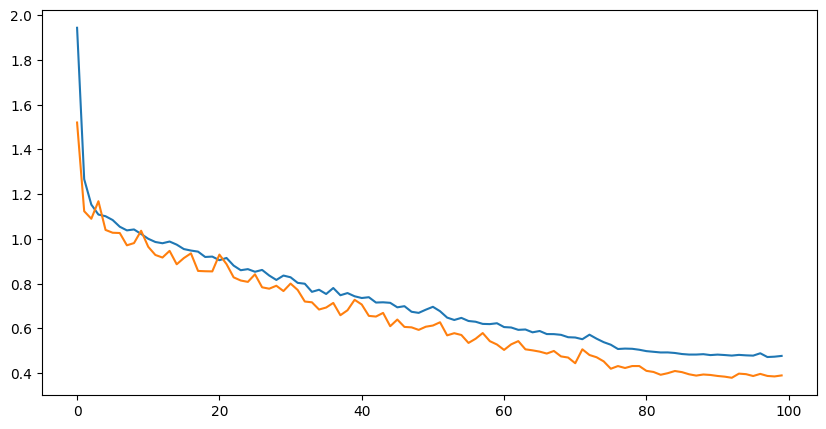

In [50]:
import matplotlib.pyplot as plt

# Plot training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')

In [49]:
from src.utils import play_denoised_sample, plot_spectrograms

play_denoised_sample(model, val_dataset, index=0)

🔊 Noisy


🔊 Denoised (model output)


🔊 Clean (reference)


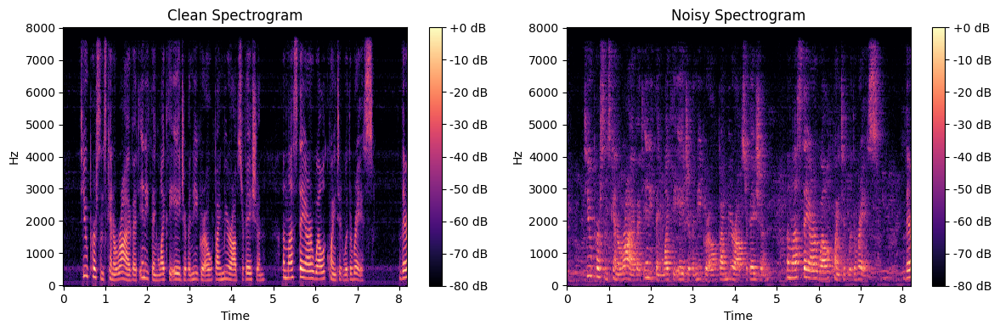

In [52]:
import librosa

plot_spectrograms(val_dataset[0][1], val_dataset[0][0])